# Machine Learning - Group Project
**Group Members**:
- 
- 
-
-
-Tagunova, Maiia (m20210984@novaims.unl.pt)
-Canhoto, Vera (m20210659@novaims.unl.pt)

In [1]:
# Jupyter notebook display size adjustment
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:95% !important; }</style>"))

<a class="anchor" id="0.1"></a>

# **Table of Contents**

1. [Business Understanding](#1)
   - 1.1 [Business Objectives](#1.1)
   - 1.2 [Programming Languages and Libraries](#1.2)
   - 1.3 [Project Plan](#1.3)


2. [Data Understanding](#2)
   - 2.1 [Initial Data Collection](#2.1)
   - 2.2 [Data Description](#2.2)
   - 2.3 [Data Exploration](#2.3)
   -2.3.1 [Data Visual exploration](#2.3.1)
   - 2.4 [Data Quality Verification](#2.4)
   -2.4.1 [Coherence check ](#2.4.1)
   -2.4.2 [Data editing ](#2.4.2)
   -2.4.2.1 [Fix wrong data types](#2.4.2.1)
   -2.4.2.2 [Ouliers](#2.4.2.2)
   -2.4.3 [Data cleansing](#2.4.3)
   -2.4.4 [Data wrangling](#2.4.4)
   -2.4.5 [Data reduction](#2.4.5)
   -2.4.6 [Redo data exploration](#2.4.6)
   - 2.5 [Definition of the initial Metric and Non-metric Features](#2.5)
  
  
3. [Feature Selection](#3)

4. [Final Selected features](#4)


5. [Re-Sampling Techniques for Imbalanced Classification](#5)
   
   
6. [Modeling](#6)
 
   
7. [Models Comparisson](#7)
 
 
8. [Final Model - Kaggle Submission](#8)

# 1. Business Understanding <a class="anchor" id="1"></a>

## 1.1 Business Objective <a class="anchor" id="1.1"></a>

To 

## 1.2 Programming Languages and Libraries <a class="anchor" id="1.1"></a>

**Programming Language:** Python

**Available / utilized libraries**

In [2]:
import time
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
import sqlite3
from sklearn.linear_model import Ridge, LassoCV
from sklearn.preprocessing import MinMaxScaler, StandardScaler, OneHotEncoder
from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import RFE

from sklearn.model_selection import StratifiedKFold
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import DecisionTreeRegressor

%config InlineBackend.figure_format = 'retina'

from datetime import datetime

from math import ceil

from itertools import product
from pandas_profiling import ProfileReport

import scipy.stats as stats

sns.set()

%matplotlib inline

## 1.3 Project Plan  <a class="anchor" id="1.4"></a>

# 2. Data Understanding <a class="anchor" id="2"></a>

## 2.1 Initial Data Collection <a class="anchor" id="2.1"></a>

We have only one source of data hence assessment of potential quality problem from data merge is not applicable

In [3]:
train = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')

#train_buy = train['Buy']
#train.drop(columns=['Buy'], inplace=True)

#identify data as being test or train so that we can separate them later on
train["Split"] = "train"
test["Split"] = "test"

#merge both data sets to facilitate the exploration and cleaning of the data

frames = [train, test]

data = pd.concat(frames)


In [4]:
data.head()

,Access_ID,Date,AccountMng_Pages,AccountMng_Duration,FAQ_Pages,FAQ_Duration,Product_Pages,Product_Duration,GoogleAnalytics_BounceRate,GoogleAnalytics_ExitRate,GoogleAnalytics_PageValue,OS,Browser,Country,Type_of_Traffic,Type_of_Visitor,Buy,Split
0,102863333,21-Mar-20,0,0.0,0,0.0,3,64.0000,0.0000,0.0667,0.0000,MacOSX,2,Portugal,1,Returner,0.0,train
1,103117814,20-May-20,0,0.0,0,0.0,23,684.5000,0.0217,0.0449,0.0000,Windows,2,France,6,Returner,0.0,train
2,103201891,4-Dec-20,0,0.0,0,0.0,8,95.0000,0.0250,0.0583,0.0000,Windows,4,Italy,1,Returner,0.0,train
3,103226087,22-Dec-20,0,0.0,0,0.0,9,608.7500,0.0000,0.0250,42.4225,Windows,2,United Kingdom,2,Returner,1.0,train
4,103234445,24-Nov-20,0,0.0,2,386.0,36,1609.9397,0.0000,0.0093,12.5033,Windows,2,Spain,3,Returner,1.0,train


In [5]:
data.tail()

,Access_ID,Date,AccountMng_Pages,AccountMng_Duration,FAQ_Pages,FAQ_Duration,Product_Pages,Product_Duration,GoogleAnalytics_BounceRate,GoogleAnalytics_ExitRate,GoogleAnalytics_PageValue,OS,Browser,Country,Type_of_Traffic,Type_of_Visitor,Buy,Split
2295,962042726,27-Nov-20,10,720.5,2,88.725,220,10580.3448,0.0048,0.0221,0.0000,Windows,2,Portugal,1,Returner,NaN,test
2296,962063064,20-Mar-20,0,0.0,0,0.000,3,55.0000,0.0667,0.1000,0.0000,MacOSX,2,Spain,3,Returner,NaN,test
2297,962147749,22-Nov-20,2,45.5,0,0.000,22,535.0000,0.0000,0.0250,9.6503,Windows,2,Spain,11,Returner,NaN,test
2298,962182167,19-Nov-20,8,166.7,0,0.000,9,171.7000,0.0167,0.0500,0.0000,Windows,2,Portugal,3,Returner,NaN,test
2299,962218682,18-May-20,1,107.0,0,0.000,27,839.6667,0.0214,0.0367,0.0000,MacOSX,2,Spain,13,Returner,NaN,test


## 2.2 Data Description  <a class="anchor" id="2.2"></a>
Based on the metadata provided:

### Metadata
Access_ID - Unique identification of the user access to the website<br>
Date - Website visit date<br>
AccountMng_Pages - Number of pages visited by the user about account management<br>
AccountMng_Duration - Total amount of time (seconds) spent by the user on account management related pages<br>
FAQ_Pages - Number of pages visited by the user about frequently asked questions, shipping information and company related pages<br>
FAQ_Duration - Total amount of time (seconds) spent by the user on FAQ pages<br>
Product_Pages - Number of pages visited by the user about products and services offered by the company<br>
Product_Duration - Total amount in time (seconds) spent by the user on products and services related pages<br>
GoogleAnalytics_BounceRate - Average bounce rate value of the pages visited by the user, provided by google analytics<br>
GoogleAnalytics_ExitRate - Average exit rate value of the pages visited by the user, provided by google analytics<br>
GoogleAnalytics_PageValue - Average page value of the pages visited by the user, provided by google analytics<br>
OS - Operating System of the user<br>
Browser - Browser used to access the webpage<br>
Country - The country of the user<br>
Type_of_Traffic - Traffic Source by which the user has accessed the website (e.g., email, banner, direct)<br>
Type_of_Visitor - User type as "New access", "Returner" or "Other"<br>
Buy - Class label indicating if the user finalized their actions in the website with a transaction<br>

## 2.3 Data Exploration  <a class="anchor" id="2.3"></a>

In [6]:
# Check default import data types of the features
# There are no nan values
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 12299 entries, 0 to 2299
Data columns (total 18 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Access_ID                   12299 non-null  int64  
 1   Date                        12299 non-null  object 
 2   AccountMng_Pages            12299 non-null  int64  
 3   AccountMng_Duration         12299 non-null  float64
 4   FAQ_Pages                   12299 non-null  int64  
 5   FAQ_Duration                12299 non-null  float64
 6   Product_Pages               12299 non-null  int64  
 7   Product_Duration            12299 non-null  float64
 8   GoogleAnalytics_BounceRate  12299 non-null  float64
 9   GoogleAnalytics_ExitRate    12299 non-null  float64
 10  GoogleAnalytics_PageValue   12299 non-null  float64
 11  OS                          12299 non-null  object 
 12  Browser                     12299 non-null  int64  
 13  Country                     1229

In [7]:
test.head()

,Access_ID,Date,AccountMng_Pages,AccountMng_Duration,FAQ_Pages,FAQ_Duration,Product_Pages,Product_Duration,GoogleAnalytics_BounceRate,GoogleAnalytics_ExitRate,GoogleAnalytics_PageValue,OS,Browser,Country,Type_of_Traffic,Type_of_Visitor,Split
0,798519314,24-Aug-20,0,0.00,0,0.0,86,5332.5478,0.0139,0.0654,0.0000,Windows,2,Brazil,1,Returner,test
1,798663101,25-May-20,2,37.50,0,0.0,55,1420.4725,0.0012,0.0058,0.0000,Android,1,Spain,4,Returner,test
2,798663221,2-Nov-20,0,0.00,0,0.0,36,788.5000,0.0000,0.0250,0.0000,Windows,6,Spain,3,Returner,test
3,798760918,14-May-20,0,0.00,0,0.0,2,689.0000,0.0000,0.1000,0.0000,Windows,2,Spain,2,New_Access,test
4,798856982,5-Nov-20,12,225.25,1,0.0,129,3367.0413,0.0014,0.0185,1.0353,Windows,4,Portugal,10,Returner,test


In [8]:
data.describe()

,Access_ID,AccountMng_Pages,AccountMng_Duration,FAQ_Pages,FAQ_Duration,Product_Pages,Product_Duration,GoogleAnalytics_BounceRate,GoogleAnalytics_ExitRate,GoogleAnalytics_PageValue,Browser,Type_of_Traffic,Buy
count,1.229900e+04,12299.000000,12299.000000,12299.000000,12299.000000,12299.000000,12299.000000,12299.000000,12299.000000,12299.000000,12299.000000,12299.000000,9999.000000
mean,5.321063e+08,2.317831,80.939384,0.504025,34.504445,31.731279,1194.583691,0.022193,0.043066,5.893057,2.355070,3.967802,0.155216
std,2.483320e+08,3.324224,176.954932,1.271059,140.875199,44.474051,1913.049335,0.048486,0.048602,18.575604,1.712942,3.681666,0.362128
min,1.028633e+08,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000
25%,3.135932e+08,0.000000,0.000000,0.000000,0.000000,7.000000,183.937500,0.000000,0.014300,0.000000,2.000000,2.000000,0.000000
50%,5.341762e+08,1.000000,8.000000,0.000000,0.000000,18.000000,598.873800,0.003100,0.025100,0.000000,2.000000,2.000000,0.000000
75%,7.491653e+08,4.000000,93.500000,0.000000,0.000000,38.000000,1465.821900,0.016800,0.050000,0.000000,2.000000,4.000000,0.000000
max,9.622187e+08,27.000000,3398.750000,24.000000,2549.375000,705.000000,63973.522200,0.200000,0.200000,361.763700,13.000000,15.000000,1.000000


In [9]:
data.describe(include="all").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Access_ID,12299.0,NaN,NaN,NaN,532106260.086105,248331987.130444,102863333.0,313593213.5,534176203.0,749165323.5,962218682.0
Date,12299,305,5-May-20,146,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AccountMng_Pages,12299.0,NaN,NaN,NaN,2.317831,3.324224,0.0,0.0,1.0,4.0,27.0
AccountMng_Duration,12299.0,NaN,NaN,NaN,80.939384,176.954932,0.0,0.0,8.0,93.5,3398.75
FAQ_Pages,12299.0,NaN,NaN,NaN,0.504025,1.271059,0.0,0.0,0.0,0.0,24.0
FAQ_Duration,12299.0,NaN,NaN,NaN,34.504445,140.875199,0.0,0.0,0.0,0.0,2549.375
Product_Pages,12299.0,NaN,NaN,NaN,31.731279,44.474051,0.0,7.0,18.0,38.0,705.0
Product_Duration,12299.0,NaN,NaN,NaN,1194.583691,1913.049335,0.0,183.9375,598.8738,1465.8219,63973.5222
GoogleAnalytics_BounceRate,12299.0,NaN,NaN,NaN,0.022193,0.048486,0.0,0.0,0.0031,0.0168,0.2
GoogleAnalytics_ExitRate,12299.0,NaN,NaN,NaN,0.043066,0.048602,0.0,0.0143,0.0251,0.05,0.2


In [10]:
# Check the number of entries, also to check if the merge was made correctly
data.shape

(12299, 18)

In [11]:
test.shape

(2300, 17)

In [12]:
train.shape

(9999, 18)

In [13]:
# Check for duplicates
data.duplicated().sum()

0

In [14]:
# Check for duplicates Access_ID
data.duplicated(subset='Access_ID').sum()

0

## 2.3.1 Data Visual exploration   <a class="anchor" id="3.1"></a>

In [15]:
#Define metric and non-metric features

metric_features = [
    "AccountMng_Pages",
    "AccountMng_Duration",
    "FAQ_Pages",
    "FAQ_Duration",
    "Product_Pages",
    "Product_Duration",
    "GoogleAnalytics_BounceRate",
    "GoogleAnalytics_ExitRate",
    "GoogleAnalytics_PageValue"
]

non_metric_features = [
    "OS",
    "Country",
    "Date",
    "Type_of_Visitor",
    "Browser",
    "Type_of_Traffic"
]

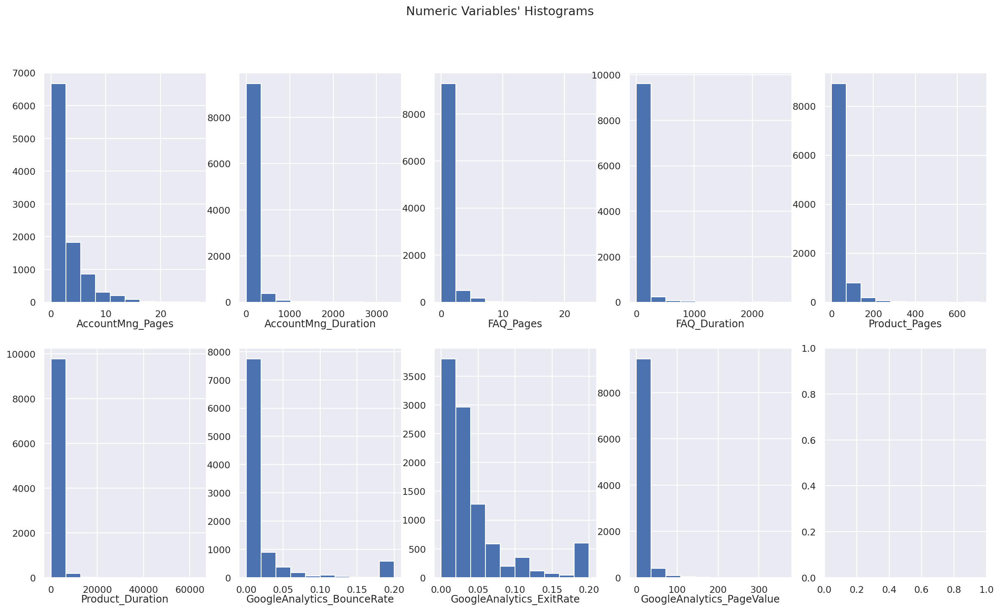

In [16]:
# All Numeric Variables' Histograms in one figure
sns.set()

# Prepare figure. Create individual axes where each histogram will be placed
fig, axes = plt.subplots(2, ceil(len(metric_features) / 2), figsize=(20, 11))

# Plot data
# Iterate across axes objects and associate each histogram (hint: use the ax.hist() instead of plt.hist()):
for ax, feat in zip(axes.flatten(), metric_features): # Notice the zip() function and flatten() method
    ax.hist(train[feat])
    ax.set_title(feat, y=-0.13)
    
# Layout
# Add a centered title to the figure:
title = "Numeric Variables' Histograms"

plt.suptitle(title)

plt.show()

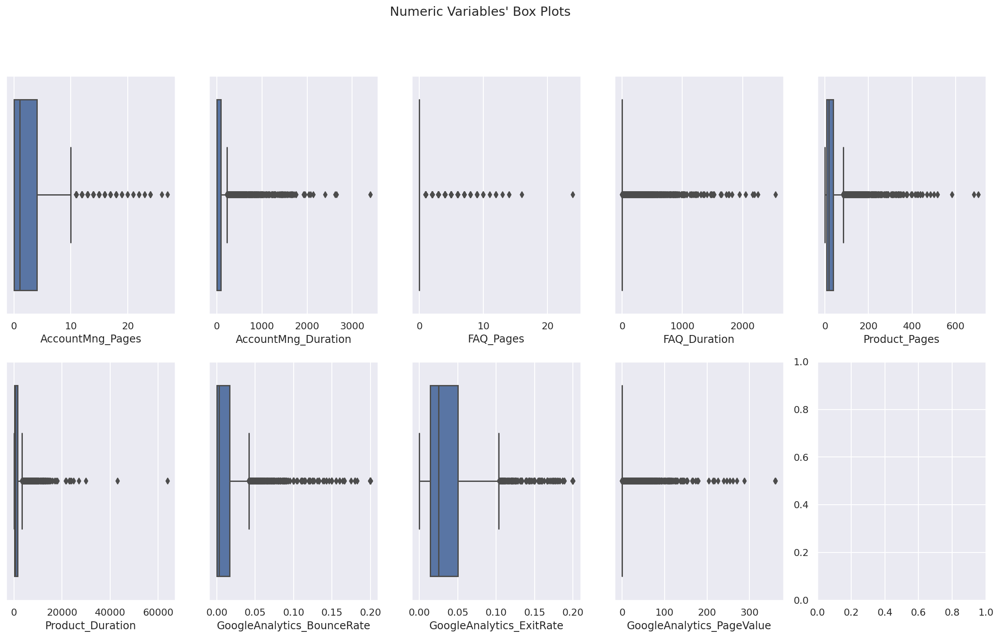

In [17]:
# All Numeric Variables' Box Plots in one figure
sns.set()

# Prepare figure. Create individual axes where each box plot will be placed
fig, axes = plt.subplots(2, ceil(len(metric_features) / 2), figsize=(20, 11))

# Plot data
# Iterate across axes objects and associate each box plot (hint: use the ax argument):
for ax, feat in zip(axes.flatten(), metric_features): # Notice the zip() function and flatten() method
    sns.boxplot(x=train[feat], ax=ax)
    
# Layout
# Add a centered title to the figure:
title = "Numeric Variables' Box Plots"

plt.suptitle(title)

plt.show()

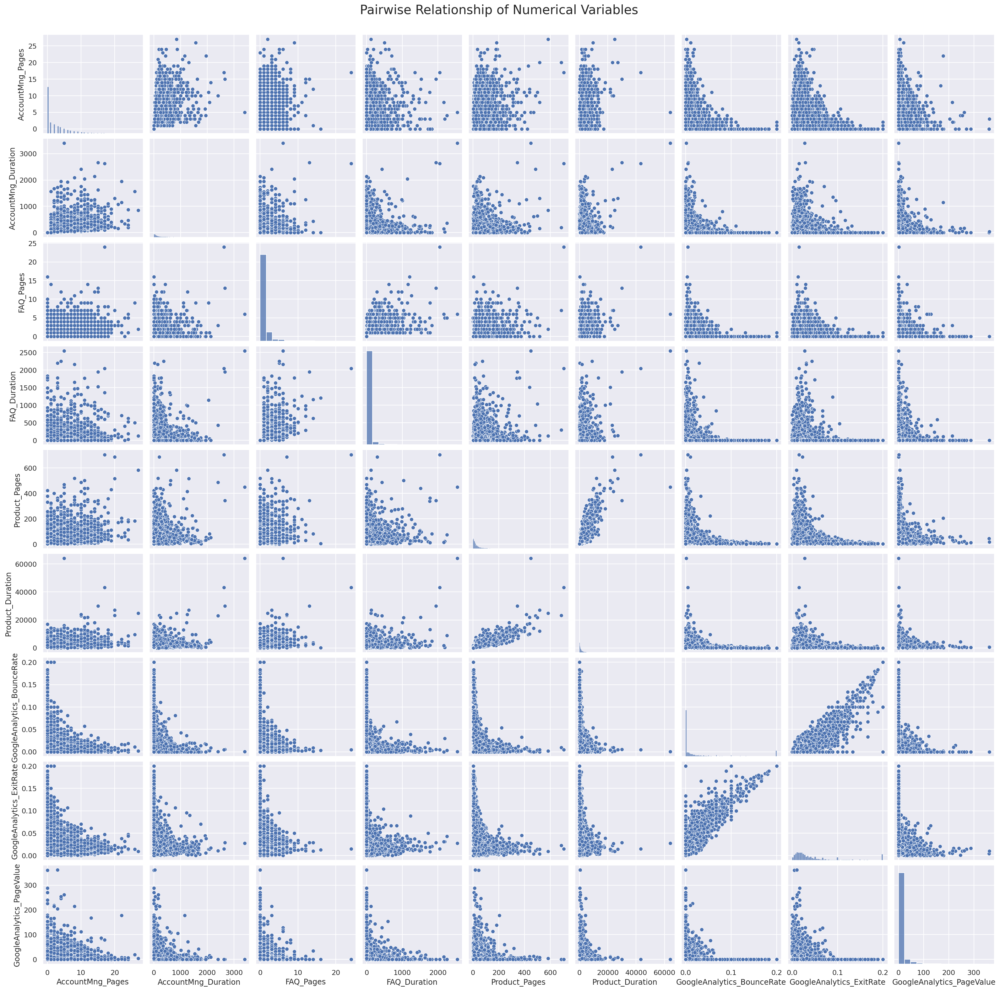

In [18]:
# Pairwise Relationship of Numerical Variables
sns.set()

# Setting pairplot
sns.pairplot(train[metric_features], diag_kind="hist")

# Layout
plt.subplots_adjust(top=0.95)
plt.suptitle("Pairwise Relationship of Numerical Variables", fontsize=20)

#plt.savefig(os.path.join('..', 'figures', 'pairwise_relationship_of_numerical_variables.png'), dpi=200)
plt.show()

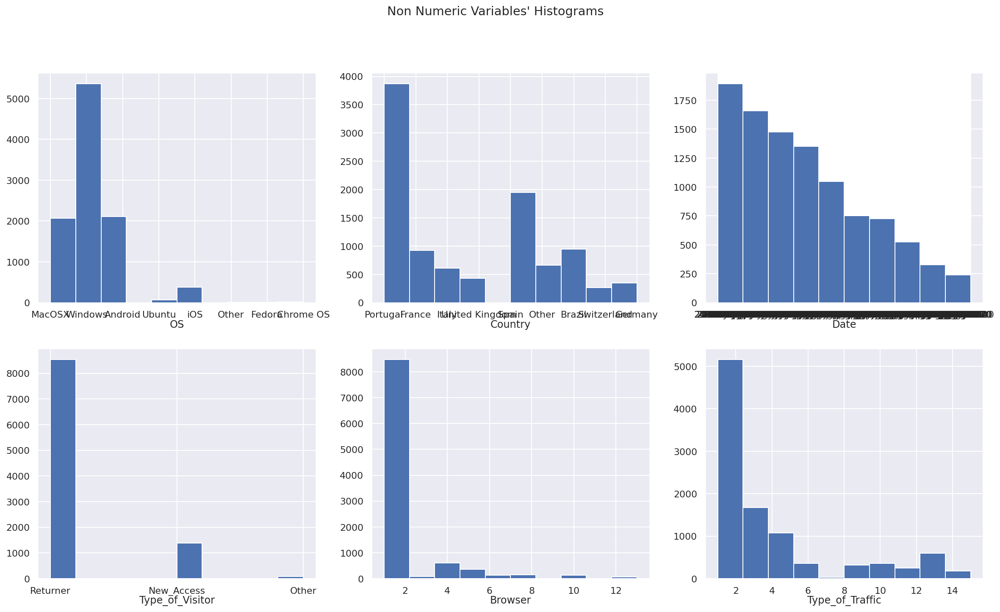

In [19]:
# All Non Numeric Variables' Histograms in one figure
sns.set()

# Prepare figure. Create individual axes where each histogram will be placed
fig, axes = plt.subplots(2, ceil(len(non_metric_features) / 2), figsize=(20, 11))

# Plot data
# Iterate across axes objects and associate each histogram (hint: use the ax.hist() instead of plt.hist()):
for ax, feat in zip(axes.flatten(), non_metric_features): # Notice the zip() function and flatten() method
    ax.hist(train[feat])
    ax.set_title(feat, y=-0.13)
    
# Layout
# Add a centered title to the figure:
title = "Non Numeric Variables' Histograms"

plt.suptitle(title)

plt.show()

In [20]:
profile = ProfileReport(
    train, 
    title='Customer Data',
    correlations={
        "pearson": {"calculate": True},
        "spearman": {"calculate": False},
        "kendall": {"calculate": False},
        "phi_k": {"calculate": False},
        "cramers": {"calculate": False},
    },
)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## 2.4 Data Quality Verification  <a class="anchor" id="2.4"></a>

## 2.4.1 Coherence check   <a class="anchor" id="3.1"></a>
(find inconsistent values, missing values, outliers and any other problem you may find in your dataset)


A initial Data Exploration shows that:<br>

-There are no missing values;<br>
-There are no duplicated values;<br>
-There are no inconsistent values;<br>
-Some data types should be altered:
  - Date should converted to timestamp
  
-There is the possibility of ouliers, we must check and remove them through:
  - Manual visual inspection
  - IQR
  - Z-score

## 2.4.2 Data editing   <a class="anchor" id="3.1"></a>
(fix inconsistent values)

### 2.4.2.1 Fix wrong data types  <a class="anchor" id="3.1"></a>

In [21]:
data['Timestamp'] = pd.to_datetime(data['Date']).astype('int64') // 10**9
metric_features.append('Timestamp')
non_metric_features.remove('Date')
data.drop(columns=["Date"], inplace=True)

data.dtypes

Access_ID                       int64
AccountMng_Pages                int64
AccountMng_Duration           float64
FAQ_Pages                       int64
FAQ_Duration                  float64
Product_Pages                   int64
Product_Duration              float64
GoogleAnalytics_BounceRate    float64
GoogleAnalytics_ExitRate      float64
GoogleAnalytics_PageValue     float64
OS                             object
Browser                         int64
Country                        object
Type_of_Traffic                 int64
Type_of_Visitor                object
Buy                           float64
Split                          object
Timestamp                       int64
dtype: object

### 2.4.2.2 Outliers  <a class="anchor" id="3.1"></a>

In [22]:
train = data.loc[data["Split"] == "train"]
test = data.loc[data["Split"] == "test"]

###  2.4.2.2.1 Manual Inspection  <a class="anchor" id="3.1"></a>

In [23]:
#removing outliers using manual way 
filters = (
    (train['AccountMng_Pages']<=17)
    &
    (train['AccountMng_Duration']<=1000)
    &
    (train['FAQ_Pages']<=8)
    &
    (train['FAQ_Duration']<=1000)
    &
    (train['Product_Pages']<=300)
    &
    (train['Product_Duration']<=17000)
    &
    (train['GoogleAnalytics_PageValue']<=110)
    
)

train_1 = train[filters]

print('Percentage of data kept after removing outliers:', np.round(train_1.shape[0] / train.shape[0], 4))

Percentage of data kept after removing outliers: 0.9757


### 2.4.2.2 IQR  <a class="anchor" id="3.1"></a>

In [24]:
#outlier removal using IQR method
q25 = train.quantile(.25)
q75 = train.quantile(.75)
iqr = (q75 - q25)

upper_lim = q75 + 1.5 * iqr
lower_lim = q25 - 1.5 * iqr

filters = []
for metric in metric_features:
    llim = lower_lim[metric]
    ulim = upper_lim[metric]
    filters.append(train[metric].between(llim, ulim, inclusive=True))

train_2 = train[np.all(filters, 0)]
print('Percentage of data kept after removing outliers:', np.round(train_2.shape[0] / train.shape[0], 4))

Percentage of data kept after removing outliers: 0.4742


### 2.4.2.3 Z-Score  <a class="anchor" id="3.1"></a>

https://towardsdatascience.com/ways-to-detect-and-remove-the-outliers-404d16608dba

In [25]:
z_scores = stats.zscore(train[metric_features])

abs_z_scores = np.abs(z_scores)
filtered_entries = (abs_z_scores < 3).all(axis=1)

train_3 = train[filtered_entries]
print('Percentage of data kept after removing outliers:', np.round(train_3.shape[0] / train.shape[0], 4))

Percentage of data kept after removing outliers: 0.8462



## 2.4.3 Data cleansing  <a class="anchor" id="3.1"></a>
(drop observations - Outlier removal and removal of inconsistent values and/or features)

### 2.4.3.1 Remove Outliers  <a class="anchor" id="3.1"></a>

In [26]:
train = train_3

frames = [train, test]
data = pd.concat(frames)

## 2.4.4 Data wrangling  <a class="anchor" id="3.1"></a> 
(feature extraction/engineering and transformation)

### 2.4.4.1 MinMax scaler <a class="anchor" id="2.4.4.1"></a>

In [27]:
data_minmax = data.copy()

In [28]:
# Use MinMaxScaler to scale the data
scaler = MinMaxScaler()
scaled_feat = scaler.fit_transform(data_minmax[metric_features])
scaled_feat

array([[0.        , 0.        , 0.        , ..., 0.3335    , 0.        ,
        0.14670659],
       [0.        , 0.        , 0.        , ..., 0.2245    , 0.        ,
        0.32634731],
       [0.        , 0.        , 0.        , ..., 0.2915    , 0.        ,
        0.91916168],
       ...,
       [0.08695652, 0.01672487, 0.        , ..., 0.125     , 0.03732471,
        0.88323353],
       [0.34782609, 0.0612755 , 0.        , ..., 0.25      , 0.        ,
        0.8742515 ],
       [0.04347826, 0.03933101, 0.        , ..., 0.1835    , 0.        ,
        0.32035928]])

In [29]:
print("Parameters fitted:\n", scaler.data_min_, "\n", scaler.data_max_)

Parameters fitted:
 [0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 1.5805152e+09] 
 [2.30000000e+01 2.72050000e+03 1.20000000e+01 2.25203330e+03
 5.34000000e+02 1.85041262e+04 2.00000000e-01 2.00000000e-01
 2.58549900e+02 1.60937280e+09]


In [30]:
data_minmax[metric_features] = scaled_feat
data_minmax.head()

,Access_ID,AccountMng_Pages,AccountMng_Duration,FAQ_Pages,FAQ_Duration,Product_Pages,Product_Duration,GoogleAnalytics_BounceRate,GoogleAnalytics_ExitRate,GoogleAnalytics_PageValue,OS,Browser,Country,Type_of_Traffic,Type_of_Visitor,Buy,Split,Timestamp
0,102863333,0.0,0.0,0.000000,0.000000,0.005618,0.003459,0.0000,0.3335,0.000000,MacOSX,2,Portugal,1,Returner,0.0,train,0.146707
1,103117814,0.0,0.0,0.000000,0.000000,0.043071,0.036992,0.1085,0.2245,0.000000,Windows,2,France,6,Returner,0.0,train,0.326347
2,103201891,0.0,0.0,0.000000,0.000000,0.014981,0.005134,0.1250,0.2915,0.000000,Windows,4,Italy,1,Returner,0.0,train,0.919162
3,103226087,0.0,0.0,0.000000,0.000000,0.016854,0.032898,0.0000,0.1250,0.164079,Windows,2,United Kingdom,2,Returner,1.0,train,0.973054
4,103234445,0.0,0.0,0.166667,0.171401,0.067416,0.087004,0.0000,0.0465,0.048359,Windows,2,Spain,3,Returner,1.0,train,0.889222


In [31]:
data_minmax[metric_features].describe().round(2)

,AccountMng_Pages,AccountMng_Duration,FAQ_Pages,FAQ_Duration,Product_Pages,Product_Duration,GoogleAnalytics_BounceRate,GoogleAnalytics_ExitRate,GoogleAnalytics_PageValue,Timestamp
count,10761.00,10761.00,10761.00,10761.00,10761.00,10761.00,10761.00,10761.00,10761.00,10761.00
mean,0.09,0.02,0.03,0.01,0.05,0.06,0.07,0.18,0.02,0.55
std,0.12,0.04,0.08,0.04,0.06,0.07,0.15,0.18,0.05,0.31
min,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
25%,0.00,0.00,0.00,0.00,0.01,0.01,0.00,0.07,0.00,0.29
50%,0.04,0.00,0.00,0.00,0.03,0.03,0.01,0.12,0.00,0.51
75%,0.13,0.03,0.00,0.00,0.07,0.07,0.07,0.23,0.00,0.87
max,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00


### 2.4.4.2 Standard scaler <a class="anchor" id="2.4.4.2"></a>

In [32]:
data_standard = data.copy()

In [33]:
scaler = StandardScaler()
scaled_feat = scaler.fit_transform(data_standard[metric_features])
scaled_feat

array([[-0.73172617, -0.54661548, -0.39806025, ...,  0.86370331,
        -0.34531724, -1.30171679],
       [-0.73172617, -0.54661548, -0.39806025, ...,  0.24120172,
        -0.34531724, -0.72364792],
       [-0.73172617, -0.54661548, -0.39806025, ...,  0.62384031,
        -0.34531724,  1.18397933],
       ...,
       [-0.02581328, -0.15667777, -0.39806025, ..., -0.32704513,
         0.41624647,  1.06836556],
       [ 2.09192538,  0.88201346, -0.39806025, ...,  0.38683283,
        -0.34531724,  1.03946211],
       [-0.37876973,  0.3703809 , -0.39806025, ...,  0.00704975,
        -0.34531724, -0.74291689]])

In [34]:
print("Parameters fitted:\n", scaler.mean_, "\n", scaler.var_)

Parameters fitted:
 [2.07313447e+00 6.37819926e+01 3.69389462e-01 1.91180002e+01
 2.80090140e+01 1.02947549e+03 1.39348574e-02 3.64531177e-02
 4.37575336e+00 1.59642232e+09] 
 [8.02708328e+00 1.36154597e+04 8.61135293e-01 6.66755921e+03
 1.01697055e+03 1.62339609e+06 8.66752707e-04 1.22639979e-03
 1.60571750e+02 8.04212518e+13]


In [35]:
data_standard[metric_features] = scaled_feat
data_standard.head()

,Access_ID,AccountMng_Pages,AccountMng_Duration,FAQ_Pages,FAQ_Duration,Product_Pages,Product_Duration,GoogleAnalytics_BounceRate,GoogleAnalytics_ExitRate,GoogleAnalytics_PageValue,OS,Browser,Country,Type_of_Traffic,Type_of_Visitor,Buy,Split,Timestamp
0,102863333,-0.731726,-0.546615,-0.398060,-0.234131,-0.784228,-0.757755,-0.473320,0.863703,-0.345317,MacOSX,2,Portugal,1,Returner,0.0,train,-1.301717
1,103117814,-0.731726,-0.546615,-0.398060,-0.234131,-0.157072,-0.270755,0.263756,0.241202,-0.345317,Windows,2,France,6,Returner,0.0,train,-0.723648
2,103201891,-0.731726,-0.546615,-0.398060,-0.234131,-0.627439,-0.733425,0.375846,0.623840,-0.345317,Windows,4,Italy,1,Returner,0.0,train,1.183979
3,103226087,-0.731726,-0.546615,-0.398060,-0.234131,-0.596081,-0.330207,-0.473320,-0.327045,3.002500,Windows,2,United Kingdom,2,Returner,1.0,train,1.357400
4,103234445,-0.731726,-0.546615,1.757173,4.493068,0.250580,0.455578,-0.473320,-0.775360,0.641394,Windows,2,Spain,3,Returner,1.0,train,1.087635


In [36]:
data_standard[metric_features].describe().round(2)

,AccountMng_Pages,AccountMng_Duration,FAQ_Pages,FAQ_Duration,Product_Pages,Product_Duration,GoogleAnalytics_BounceRate,GoogleAnalytics_ExitRate,GoogleAnalytics_PageValue,Timestamp
count,10761.00,10761.00,10761.00,10761.00,10761.00,10761.00,10761.00,10761.00,10761.00,10761.00
mean,-0.00,0.00,-0.00,0.00,-0.00,0.00,0.00,-0.00,-0.00,0.00
std,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00
min,-0.73,-0.55,-0.40,-0.23,-0.88,-0.81,-0.47,-1.04,-0.35,-1.77
25%,-0.73,-0.55,-0.40,-0.23,-0.63,-0.64,-0.47,-0.63,-0.35,-0.83
50%,-0.38,-0.49,-0.40,-0.23,-0.31,-0.34,-0.42,-0.33,-0.35,-0.12
75%,0.33,0.18,-0.40,-0.23,0.25,0.26,0.03,0.27,-0.35,1.01
max,7.39,22.77,12.53,27.35,15.87,13.72,6.32,4.67,20.06,1.44


### 2.4.4.3 Scaler selection <a class="anchor" id="2.4.4.3"></a>

In [37]:
data = data_minmax.copy()#standard.copy()

## 2.4.5 Data reduction <a class="anchor" id="3.1"></a>
(reducing the dimensionality of a dataset, producing summary statistics, reducing the number of records in a dataset)


15.1. Correlation's: Pearson and Spearman
15.2. Recursive Feature Elimination - RFE
15.3. LASSO Regression
15.4. RIDGE Regression
15.5. Chi-Square
15.6. Principal Components Analysis - PCA
15.7. ANOVA F-Values
15.8. Feature Importances - Tree Based Classifiers
15.9. Gini Importance | Entropy Importance
15.10. MAE | MSE | FRIEDMAN Importances
15.11. AdaBoost Feature Importances

### 2.4.5.1 Dimensionality Reduction: PCA <a class="anchor" id="3.1"></a>

Variable selection: Redundancy VS Relevancy look at correlation graphics
    

## 2.4.6 Redo data exploration <a class="anchor" id="3.1"></a>
Check if the data looks the way you expect it to.

Have you missed some outliers?
Are there still missing values?
Is the data normalized?

# 3.Feature Selection  <a class="anchor" id="2"></a>

In [38]:
X_train = data.loc[data["Split"] == "train"][metric_features]
X_test = data.loc[data["Split"] == "test"][metric_features]

X_train_nm = data.loc[data["Split"] == "train"][non_metric_features]
X_test_nm = data.loc[data["Split"] == "test"][non_metric_features]

y_train = data.loc[data["Split"] == "train"]['Buy'].astype(bool)
y_test = data.loc[data["Split"] == "test"]['Buy'].astype(bool)

## 3.1 Correlation's: Pearson and Spearman <a class="anchor" id="3.1"></a>

In [39]:
def plot_corr(corr, caption):

    # Prepare figure
    fig = plt.figure(figsize=(10, 8))

    # Build annotation matrix (values above |0.5| will appear annotated in the plot)
    mask_annot = np.absolute(corr.values) >= 0.5
    annot = np.where(mask_annot, corr.values, np.full(corr.shape,"")) # Try to understand what this np.where() does

    # Plot heatmap of the correlation matrix
    sns.heatmap(data=corr, annot=annot, cmap=sns.diverging_palette(220, 10, as_cmap=True), 
            fmt='s', vmin=-1, vmax=1, center=0, square=True, linewidths=.5)

    # Layout
    fig.subplots_adjust(top=0.95)
    fig.suptitle(caption, fontsize=20)

    plt.show()

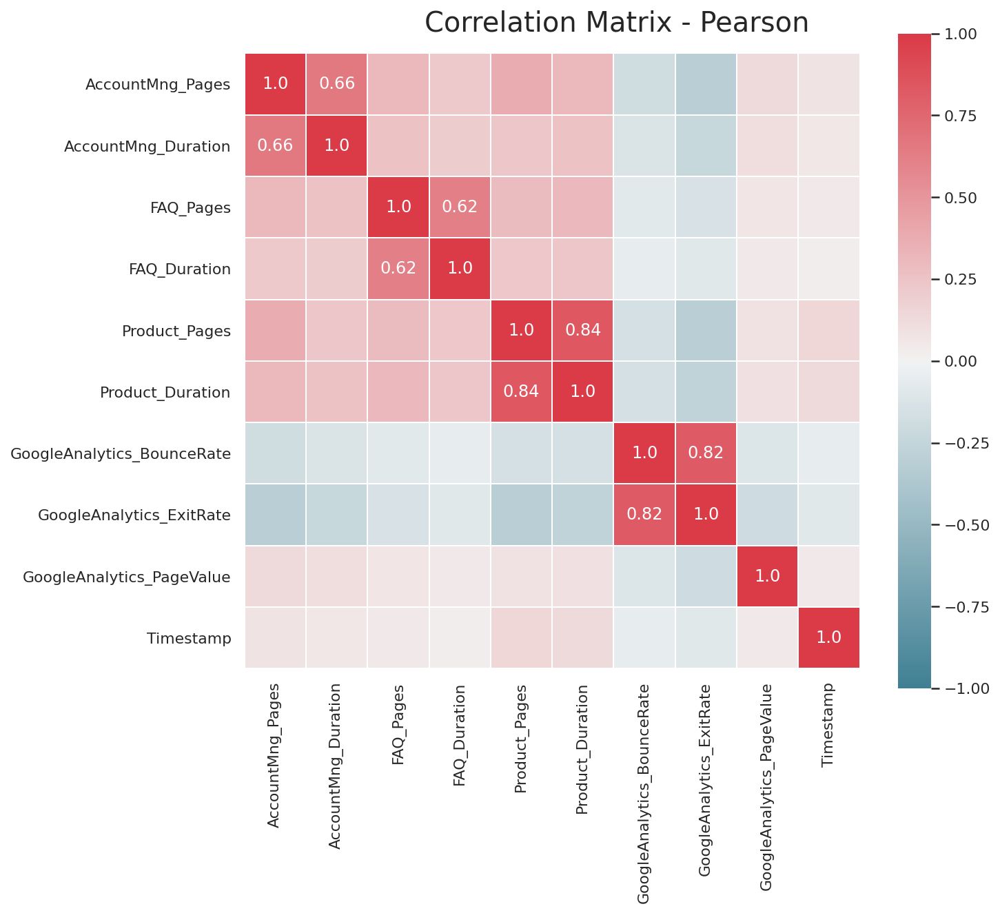

In [40]:
# Obtain correlation matrix. Round the values to 2 decimal cases. Use the DataFrame corr() and round() method.
corr_pearson = np.round(data[metric_features].corr(method="pearson"), decimals=2)
plot_corr(corr_pearson, "Correlation Matrix - Pearson")

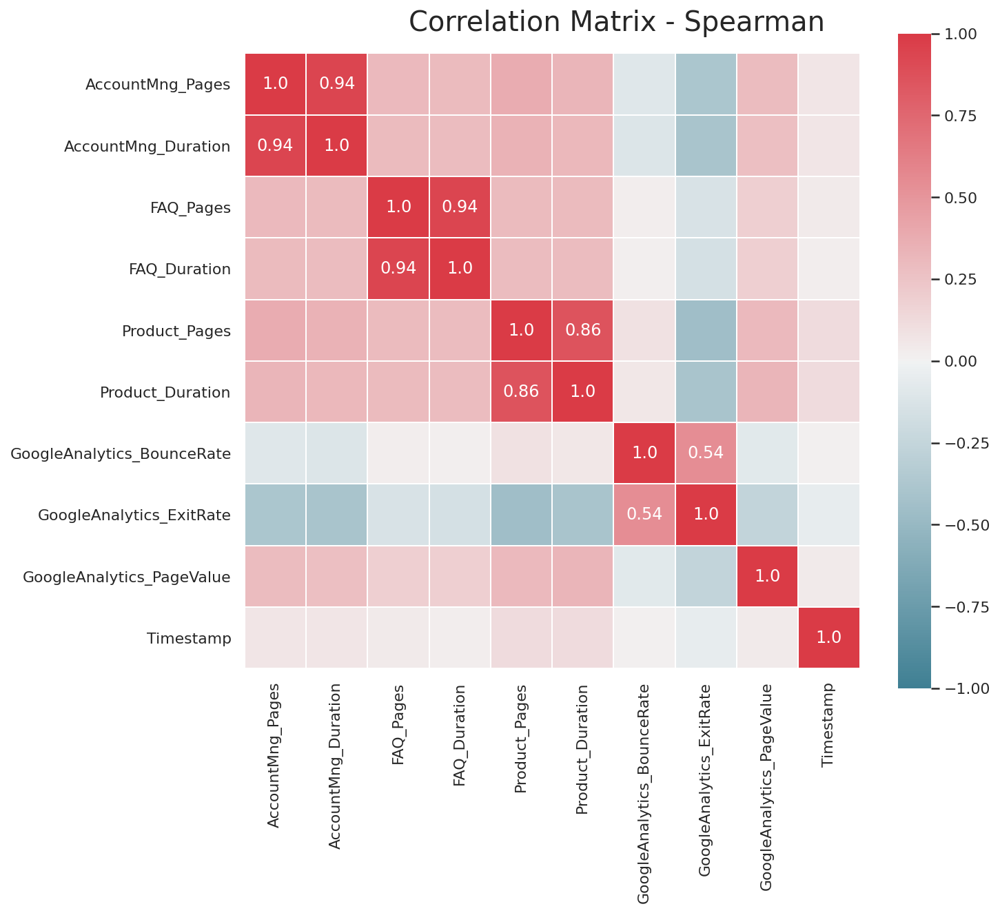

In [41]:
# Obtain correlation matrix. Round the values to 2 decimal cases. Use the DataFrame corr() and round() method.
corr_spearman = np.round(data[metric_features].corr(method="spearman"), decimals=2)
plot_corr(corr_spearman, "Correlation Matrix - Spearman")

## 3.2 Recursive Feature Elimination - RFE <a class="anchor" id="3.2"></a>

In [42]:
# create a Logistic Regression Classifier instance called model
model = LogisticRegression()

In [43]:
# create a RFE instance 
rfe = RFE(estimator = model, n_features_to_select = 3)

In [44]:
scaler = MinMaxScaler().fit(X_train)

In [45]:
#scaling the training into values between 0 and 1
X_train_scaled = scaler.transform(X_train) # this will return an array
# Convert the array to a pandas dataframe
X_train_scaled = pd.DataFrame(X_train_scaled, columns = X_train.columns).set_index(X_train.index)
X_train_scaled.head(3)

,AccountMng_Pages,AccountMng_Duration,FAQ_Pages,FAQ_Duration,Product_Pages,Product_Duration,GoogleAnalytics_BounceRate,GoogleAnalytics_ExitRate,GoogleAnalytics_PageValue,Timestamp
0,0.0,0.0,0.0,0.0,0.018182,0.009131,0.000000,0.353097,0.0,0.146707
1,0.0,0.0,0.0,0.0,0.139394,0.097659,0.130174,0.237692,0.0,0.326347
2,0.0,0.0,0.0,0.0,0.048485,0.013554,0.149970,0.308629,0.0,0.919162


In [46]:
# Check if any of the numerical variables is univariate (variance is equal to 0). Drop those variables if existent.
X_train_scaled.var()

AccountMng_Pages              0.050831
AccountMng_Duration           0.025867
FAQ_Pages                     0.042287
FAQ_Duration                  0.012993
Product_Pages                 0.027862
Product_Duration              0.025852
GoogleAnalytics_BounceRate    0.017124
GoogleAnalytics_ExitRate      0.026144
GoogleAnalytics_PageValue     0.030482
Timestamp                     0.096760
dtype: float64

In [47]:
# Transform the data using RFE by applying the method fit_transform() to the instance rfe
X_rfe = rfe.fit_transform(X = X_train_scaled, y = y_train)

In [48]:
# Check the variables that were selected by RFE as the most "important" ones by calling the attribute support_ to rfe
X_train_scaled.columns

Index(['AccountMng_Pages', 'AccountMng_Duration', 'FAQ_Pages', 'FAQ_Duration',
       'Product_Pages', 'Product_Duration', 'GoogleAnalytics_BounceRate',
       'GoogleAnalytics_ExitRate', 'GoogleAnalytics_PageValue', 'Timestamp'],
      dtype='object')

In [49]:
#
rfe.support_

array([False, False, False, False, False,  True, False,  True,  True,
       False])

In [50]:
#Check the ranking of the variables defined by RFE as the most "important" ones by applying the attribute ranking_ to rfe
rfe.ranking_

array([7, 5, 8, 4, 6, 1, 2, 1, 1, 3])

In [51]:
#Create an object (pandas Series) that will have as index the X_train_num columns names and the support_ attribute as value
selected_features = pd.Series(rfe.support_, index = X_train_scaled.columns)
selected_features

AccountMng_Pages              False
AccountMng_Duration           False
FAQ_Pages                     False
FAQ_Duration                  False
Product_Pages                 False
Product_Duration               True
GoogleAnalytics_BounceRate    False
GoogleAnalytics_ExitRate       True
GoogleAnalytics_PageValue      True
Timestamp                     False
dtype: bool

## 3.3 LASSO Regression <a class="anchor" id="3.3"></a>

In [52]:
# define model
model = LassoCV()

# fit model
model.fit(X_train, y_train)

weights = list(zip(abs(model.coef_), X_train.columns.to_list()))
weights = sorted(weights, key=lambda x: x[0], reverse=True)

for feature in weights:
    print(feature)

(4.574641792075529, 'GoogleAnalytics_PageValue')
(0.34134342246618116, 'AccountMng_Duration')
(0.3149658230669848, 'FAQ_Duration')
(0.2713210632790958, 'Product_Duration')
(0.13609961992271474, 'Product_Pages')
(0.09735935200795755, 'GoogleAnalytics_ExitRate')
(0.09214998174540599, 'AccountMng_Pages')
(0.08548935274881533, 'Timestamp')
(0.032351945343191704, 'GoogleAnalytics_BounceRate')
(0.026203237876354077, 'FAQ_Pages')


## 3.4 RIDGE Regression <a class="anchor" id="3.4"></a>

In [53]:
# define model
model = Ridge(alpha=1.0)

# fit model
model.fit(X_train, y_train)

weights = list(zip(abs(model.coef_), X_train.columns.to_list()))
weights = sorted(weights, key=lambda x: x[0], reverse=True)

for feature in weights:
    print(feature)

(4.281792321200084, 'GoogleAnalytics_PageValue')
(0.3142833532140586, 'AccountMng_Duration')
(0.2788796418142188, 'Product_Duration')
(0.267087539014528, 'FAQ_Duration')
(0.12796804203409598, 'Product_Pages')
(0.11463173587921699, 'GoogleAnalytics_ExitRate')
(0.08628033331782403, 'Timestamp')
(0.07911285016132681, 'AccountMng_Pages')
(0.04540616404379125, 'FAQ_Pages')
(0.027343545755312046, 'GoogleAnalytics_BounceRate')


## 3.5 Chi-Square <a class="anchor" id="3.5"></a>

In [54]:
def TestIndependence(X, y, var, alpha=0.05):        
    dfObserved = pd.crosstab(y,X) 
    chi2, p, dof, expected = stats.chi2_contingency(dfObserved.values)
    dfExpected = pd.DataFrame(expected, columns=dfObserved.columns, index=dfObserved.index)
    if p<alpha:
        result="{0} is IMPORTANT for Prediction".format(var)
    else:
        result="{0} is NOT an important predictor. (Discard {0} from model)".format(var)
    print(result)

In [55]:
for var in data[non_metric_features]:
    TestIndependence(data[non_metric_features][var], data['Buy'], var)

OS is IMPORTANT for Prediction
Country is NOT an important predictor. (Discard Country from model)
Type_of_Visitor is IMPORTANT for Prediction
Browser is IMPORTANT for Prediction
Type_of_Traffic is IMPORTANT for Prediction


## 3.6 Principal Components Analysis - PCA <a class="anchor" id="3.6"></a>

In [56]:
pca = PCA(.95)

pca.fit(X_train)

X_train_transformed = pca.transform(X_train)
X_test_transformed = pca.transform(X_test)

In [57]:
X_train_transformed[0]

array([ 0.41776765,  0.10150267, -0.07281889, -0.05487568,  0.07544163])

## 3.7 ANOVA F-Values <a class="anchor" id="3.7"></a>

## 3.8 Feature Importances - Tree Based Classifiers <a class="anchor" id="3.8"></a>

## 3.9 Gini Importance | Entropy Importance <a class="anchor" id="3.9"></a>

## 3.10 MAE | MSE | FRIEDMAN Importances <a class="anchor" id="3.10"></a>

In [58]:
mse_importance = DecisionTreeRegressor().fit(X_train, y_train).feature_importances_
mae_importance = DecisionTreeRegressor(criterion='mae').fit(X_train, y_train).feature_importances_
friedman_importance = DecisionTreeRegressor(criterion='friedman_mse').fit(X_train, y_train).feature_importances_

In [59]:
weights = list(zip(mse_importance, mae_importance, friedman_importance, X_train.columns.to_list()))
weights = sorted(weights, key=lambda x: x[0], reverse=True)

for feature in weights:
    print(feature)

(0.4219294483883054, 0.3641666666666665, 0.41827686250200347, 'GoogleAnalytics_PageValue')
(0.10993038946495731, 0.1216666666666667, 0.1117247000325732, 'Product_Duration')
(0.09398165689472654, 0.11250000000000006, 0.08939321974950358, 'GoogleAnalytics_ExitRate')
(0.08572457892390678, 0.0816666666666667, 0.08831079821131972, 'Timestamp')
(0.07935088077547892, 0.06000000000000002, 0.07014717379076053, 'GoogleAnalytics_BounceRate')
(0.07472274230972877, 0.06416666666666665, 0.07688155243847096, 'AccountMng_Duration')
(0.05134805729779418, 0.09583333333333328, 0.06334987270887303, 'Product_Pages')
(0.046431013688240194, 0.05333333333333332, 0.04803706242705629, 'AccountMng_Pages')
(0.024277259493756347, 0.03666666666666665, 0.01995726056169378, 'FAQ_Duration')
(0.012303972763105648, 0.010000000000000002, 0.013921497577745525, 'FAQ_Pages')


In [60]:
# tidy = zippy.melt(id_vars='col').rename(columns=str.title)
# tidy.sort_values(['Value'], ascending = False, inplace = True)

# plt.figure(figsize=(15,20))
# sns.barplot(y='Col', x='Value', hue='Variable', data=tidy)

## 3.11 AdaBoost Feature Importances <a class="anchor" id="3.11"></a>

In [61]:
from sklearn.ensemble import AdaBoostClassifier
>>> from sklearn.datasets import make_classification

In [62]:
ab = AdaBoostClassifier(random_state = 5).fit(X_train, y_train)

/home/bitseybloom/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='importances', ylabel='features'>

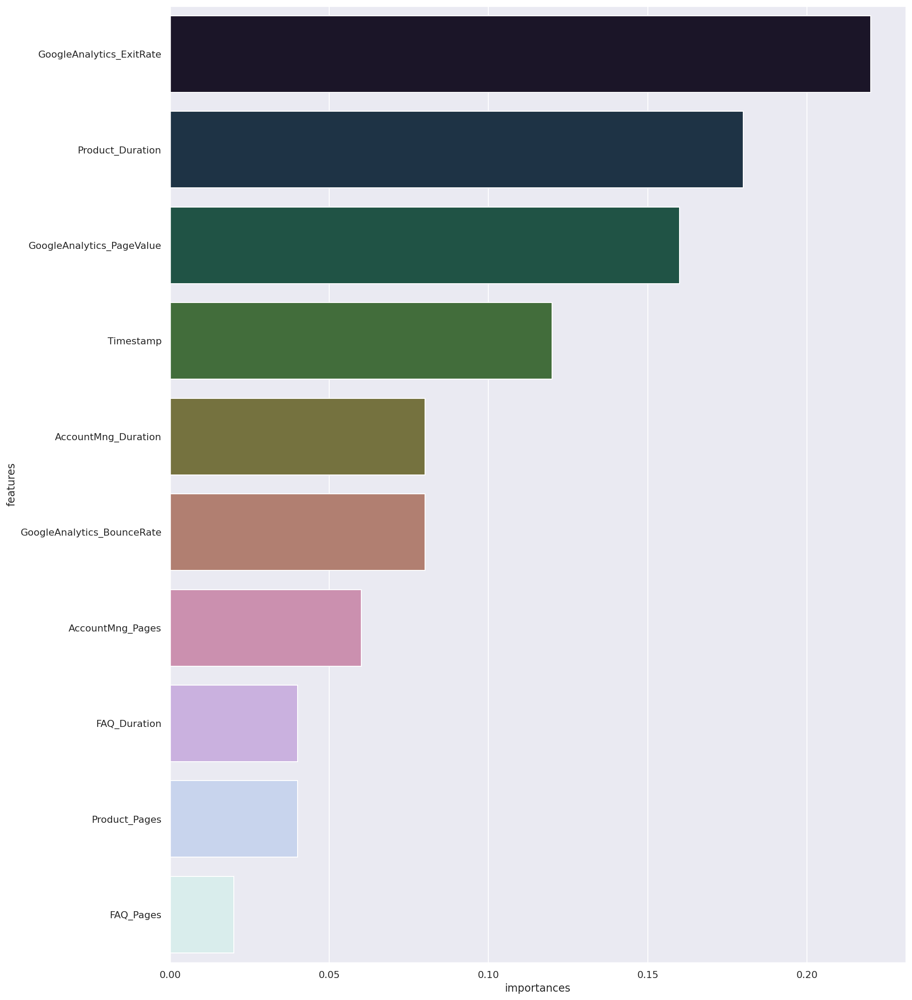

In [63]:
plt.figure(figsize=(15,20))
importances = ab.feature_importances_
features = X_train.columns
data_tuples = list(zip(importances, features))
data_1 = pd.DataFrame(data_tuples, columns = ['importances', 'features'])
data_1 = data_1.sort_values('importances', ascending = False)
sns.barplot(data_1['importances'], data_1['features'], palette = 'cubehelix', orient = 'h')

# 4.Final Selected features  <a class="anchor" id="2"></a>

Split into X (Input variables) and y (Target)

### 4.1.1 Selecting features <a class="anchor" id="4.1.1"></a>

### 4.2.1 One-hot encoding <a class="anchor" id="4.2.1"></a>

In [64]:
data_ohc = data.copy()
ohc = OneHotEncoder(sparse=False, drop="first")
ohc_feat = ohc.fit_transform(data_ohc[non_metric_features])
ohc_feat_names = ohc.get_feature_names()
ohc_data = pd.DataFrame(ohc_feat, index=data_ohc.index, columns=ohc_feat_names)  # Why the index=df_ohc.index?
ohc_data.head()

,x0_Chrome OS,x0_Fedora,x0_MacOSX,x0_Other,x0_Ubuntu,x0_Windows,x0_iOS,x1_France,x1_Germany,x1_Italy,...,x4_6,x4_7,x4_8,x4_9,x4_10,x4_11,x4_12,x4_13,x4_14,x4_15
0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [65]:
ohc_data.describe(include="all").T

,count,mean,std,min,25%,50%,75%,max
x0_Chrome OS,10761.0,0.001487,0.038533,0.0,0.0,0.0,0.0,1.0
x0_Fedora,10761.0,0.000465,0.021552,0.0,0.0,0.0,0.0,1.0
x0_MacOSX,10761.0,0.207137,0.405273,0.0,0.0,0.0,0.0,1.0
x0_Other,10761.0,0.000558,0.023607,0.0,0.0,0.0,0.0,1.0
x0_Ubuntu,10761.0,0.005204,0.071954,0.0,0.0,0.0,0.0,1.0
x0_Windows,10761.0,0.537404,0.498622,0.0,0.0,1.0,1.0,1.0
x0_iOS,10761.0,0.039773,0.195435,0.0,0.0,0.0,0.0,1.0
x1_France,10761.0,0.093114,0.290606,0.0,0.0,0.0,0.0,1.0
x1_Germany,10761.0,0.036892,0.188507,0.0,0.0,0.0,0.0,1.0
x1_Italy,10761.0,0.061704,0.240629,0.0,0.0,0.0,0.0,1.0


In [66]:
data_ohc = pd.concat([data_ohc.drop(columns=non_metric_features), ohc_data], axis=1)
data = data_ohc.copy()
data.head().T

,0,1,2,3,4
Access_ID,102863333,103117814,103201891,103226087,103234445
AccountMng_Pages,0.0,0.0,0.0,0.0,0.0
AccountMng_Duration,0.0,0.0,0.0,0.0,0.0
FAQ_Pages,0.0,0.0,0.0,0.0,0.166667
FAQ_Duration,0.0,0.0,0.0,0.0,0.171401
Product_Pages,0.005618,0.043071,0.014981,0.016854,0.067416
Product_Duration,0.003459,0.036992,0.005134,0.032898,0.087004
GoogleAnalytics_BounceRate,0.0,0.1085,0.125,0.0,0.0
GoogleAnalytics_ExitRate,0.3335,0.2245,0.2915,0.125,0.0465
GoogleAnalytics_PageValue,0.0,0.0,0.0,0.164079,0.048359


### 4.3.1 Dropping non-features <a class="anchor" id="4.3.1"></a>

In [67]:
non_features = [column for column in data.columns if (column not in metric_features) and (column not in non_metric_features)]

X = data.drop(columns=non_features)
X_train = data.loc[data["Split"] == "train"].drop(columns=non_features)
X_test = data.loc[data["Split"] == "test"].drop(columns=non_features)

y = data["Buy"].astype(bool)
y_train = data.loc[data["Split"] == "train"]["Buy"].astype(bool)

# 5. Re-Sampling Techniques for Imbalanced Classification <a class="anchor" id="2"></a>

Re-sampling Techniques for Imbalanced Classification
 Undersampling
 Oversampling
 Undersampling & Oversampling (Combined)
SMOTE - Synthetic Minority Oversampling Technique
ADASYN - Adaptive Synthetic Oversampling
Train Test Split

# 6. Modeling <a class="anchor" id="2"></a>

 K-Fold and Repeated K-Fold parameters
 Multi-Layer Perceptron
1. Grid Search NN
 Random Forest
 Logistic Regression
 Instance Based Learning
 Decision Trees
 Naive Bayes
 Support Vector Machine - SVC (Classifier)
 Ridge Classifier
 Ensemble Methods
.1. Balanced Bagging Classifier
.2. Balanced Bagging Classifier + Trees
.3. AdaBoost Classifier
.4. Stacking Classifier
.5. Voting Classifier
.6. Gradient Boosting Classifier

In [93]:
def avg_score(model, X, y):
    # apply kfold
    skf = StratifiedKFold(n_splits=100)
    # create lists to store the results from the different models 
    score_train = []
    score_test = []
    timer = []
    for train_index, test_index in skf.split(X,y):
        # get the indexes of the observations assigned for each partition
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]
        # start counting time
        begin = time.perf_counter()
        # fit the model to the data
        model.fit(X_train, y_train)
        # finish counting time
        end = time.perf_counter()
        # check the mean accuracy for the train
        value_train = model.score(X_train, y_train)
        # check the mean accuracy for the test
        value_test = model.score(X_test,y_test)
        # append the accuracies, the time and the number of iterations in the corresponding list
        score_train.append(value_train)
        score_test.append(value_test)
        timer.append(end-begin)
    # calculate the average and the std for each measure (accuracy, time and number of iterations)
    avg_time = round(np.mean(timer),3)
    avg_train = round(np.mean(score_train),3)
    avg_test = round(np.mean(score_test),3)
    std_time = round(np.std(timer),2)
    std_train = round(np.std(score_train),2)
    std_test = round(np.std(score_test),2)
    
    return str(avg_time) + '+/-' + str(std_time), str(avg_train) + '+/-' + str(std_train),\
str(avg_test) + '+/-' + str(std_test)

In [ ]:
def show_results(X, y, df, *args):
    """
    Receive an empty dataframe and the different models and call the function avg_score
    """
    count = 0
    # for each model passed as argument
    for arg in args:
        # obtain the results provided by avg_score
        time, avg_train, avg_test = avg_score(arg, X, y)
        # store the results in the right row
        df.iloc[count] = time, avg_train, avg_test
        count+=1
    return df

## 6.1 Logistic regression <a class="anchor" id="6.1"></a>

In [ ]:
log_none = LogisticRegression(penalty='none')
log_l1 = LogisticRegression(penalty='l1', solver='liblinear')
log_l2 = LogisticRegression(penalty='l2', solver='liblinear')
df = pd.DataFrame(columns = ['Time', 'Train', 'Test'], index = ['none', 'l1', 'l2'])
show_results(X_train, y_train, df, log_none, log_l1, log_l2)

## 6.2 Decision trees <a class="anchor" id="6.2"></a>

In [69]:
# in anaconda prompt: conda install python-graphviz
# !pip install pydotplus
from sklearn.tree import export_graphviz
import graphviz
import pydotplus

def plot_tree(model, X):
    dot_data = export_graphviz(model,
                               feature_names=X.columns,  
                               class_names=["No Buy", "Buy"],
                               filled=True)
    pydot_graph = pydotplus.graph_from_dot_data(dot_data)
    pydot_graph.set_size('"20,20"')
    return graphviz.Source(pydot_graph.to_string())

In [76]:
dt_gini = DecisionTreeClassifier()
dt_entropy = DecisionTreeClassifier(criterion = 'entropy')
df = pd.DataFrame(columns = ['Time', 'Train', 'Test'], index = ['Gini', 'Entropy'])
show_results(X_train, y_train, df, dt_gini, dt_entropy)

,Time,Train,Test
Gini,0.045+/-0.01,1.0+/-0.0,0.866+/-0.01
Entropy,0.043+/-0.0,1.0+/-0.0,0.864+/-0.01


In [78]:
dt_full = DecisionTreeClassifier()
dt_10 = DecisionTreeClassifier(max_depth=10)
dt_8 = DecisionTreeClassifier(max_depth=8)
dt_6 = DecisionTreeClassifier(max_depth=6)
dt_4 = DecisionTreeClassifier(max_depth=4)
dt_2 = DecisionTreeClassifier(max_depth=2)
df = pd.DataFrame(columns = ['Time', 'Train', 'Test'], index = ['Full', '10', '8', '6', '4', '2'])
show_results(X_train, y_train, df, dt_full, dt_10, dt_8, dt_6, dt_4, dt_2)

,Time,Train,Test
Full,0.045+/-0.0,1.0+/-0.0,0.866+/-0.01
10,0.034+/-0.0,0.951+/-0.0,0.889+/-0.01
8,0.038+/-0.01,0.934+/-0.0,0.892+/-0.01
6,0.027+/-0.0,0.918+/-0.0,0.902+/-0.01
4,0.02+/-0.0,0.907+/-0.0,0.902+/-0.01
2,0.013+/-0.0,0.898+/-0.0,0.897+/-0.01


In [82]:
dt = DecisionTreeClassifier(max_depth=6)
dt_5 = DecisionTreeClassifier(max_depth=6, min_samples_split=5)
dt_10 = DecisionTreeClassifier(max_depth=6, min_samples_split=10)
dt_20 = DecisionTreeClassifier(max_depth=6, min_samples_split=20)
dt_40 = DecisionTreeClassifier(max_depth=6, min_samples_split=40)
dt_80 = DecisionTreeClassifier(max_depth=6, min_samples_split=80)
dt_160 = DecisionTreeClassifier(max_depth=6, min_samples_split=160)
df = pd.DataFrame(columns = ['Time', 'Train', 'Test'], index = ['Default', '5', '10', '20', '40', '80', '160'])
show_results(X_train, y_train, df, dt, dt_5, dt_10, dt_20, dt_40, dt_80, dt_160)

,Time,Train,Test
Default,0.029+/-0.0,0.918+/-0.0,0.902+/-0.01
5,0.023+/-0.0,0.918+/-0.0,0.902+/-0.01
10,0.024+/-0.0,0.918+/-0.0,0.902+/-0.01
20,0.023+/-0.0,0.917+/-0.0,0.901+/-0.01
40,0.024+/-0.0,0.916+/-0.0,0.902+/-0.01
80,0.024+/-0.0,0.914+/-0.0,0.903+/-0.01
160,0.021+/-0.0,0.911+/-0.0,0.902+/-0.01


In [88]:
dt = DecisionTreeClassifier(max_depth=6)
dt_2 = DecisionTreeClassifier(max_depth=6, min_samples_leaf=2)
dt_5 = DecisionTreeClassifier(max_depth=6, min_samples_leaf=5)
dt_10 = DecisionTreeClassifier(max_depth=6, min_samples_leaf=10)
dt_20 = DecisionTreeClassifier(max_depth=6, min_samples_leaf=20)
dt_40 = DecisionTreeClassifier(max_depth=6, min_samples_leaf=40)
dt_80 = DecisionTreeClassifier(max_depth=6, min_samples_leaf=80)
dt_160 = DecisionTreeClassifier(max_depth=6, min_samples_leaf=160)
df = pd.DataFrame(columns = ['Time', 'Train', 'Test'], index = ['Default', '2', '5', '10', '20', '40', '80', '160'])
show_results(X_train, y_train, df, dt, dt_2, dt_5, dt_10, dt_20, dt_40, dt_80, dt_160)

,Time,Train,Test
Default,0.03+/-0.0,0.918+/-0.0,0.902+/-0.01
2,0.025+/-0.0,0.918+/-0.0,0.902+/-0.01
5,0.027+/-0.0,0.916+/-0.0,0.901+/-0.01
10,0.033+/-0.01,0.915+/-0.0,0.902+/-0.01
20,0.026+/-0.0,0.914+/-0.0,0.902+/-0.01
40,0.022+/-0.0,0.913+/-0.0,0.902+/-0.01
80,0.024+/-0.0,0.91+/-0.0,0.904+/-0.01
160,0.022+/-0.0,0.903+/-0.0,0.895+/-0.01


In [89]:
dt = DecisionTreeClassifier(max_depth=6)
dt_16 = DecisionTreeClassifier(max_depth=6, max_leaf_nodes=16)
dt_8 = DecisionTreeClassifier(max_depth=6, max_leaf_nodes=8)
dt_4 = DecisionTreeClassifier(max_depth=6, max_leaf_nodes=4)
df = pd.DataFrame(columns = ['Time', 'Train', 'Test'], index = ['Default', '16', '8', '4'])
show_results(X_train, y_train, df, dt, dt_16, dt_8, dt_4)

,Time,Train,Test
Default,0.027+/-0.0,0.918+/-0.0,0.902+/-0.01
16,0.021+/-0.0,0.911+/-0.0,0.902+/-0.01
8,0.018+/-0.0,0.906+/-0.0,0.899+/-0.01
4,0.013+/-0.0,0.898+/-0.0,0.895+/-0.01


In [90]:
dt = DecisionTreeClassifier(max_depth=6)
dt_01 = DecisionTreeClassifier(max_depth=6, min_impurity_decrease=0.01)
dt_02 = DecisionTreeClassifier(max_depth=6, min_impurity_decrease=0.02)
dt_05 = DecisionTreeClassifier(max_depth=6, min_impurity_decrease=0.05)
df = pd.DataFrame(columns = ['Time', 'Train', 'Test'], index = ['Default', '0.01', '0.02', '0.05'])
show_results(X_train, y_train, df, dt, dt_01, dt_02, dt_05)

,Time,Train,Test
Default,0.026+/-0.0,0.918+/-0.0,0.902+/-0.01
0.01,0.012+/-0.0,0.885+/-0.0,0.885+/-0.01
0.02,0.012+/-0.0,0.885+/-0.0,0.885+/-0.01
0.05,0.012+/-0.0,0.885+/-0.0,0.885+/-0.01


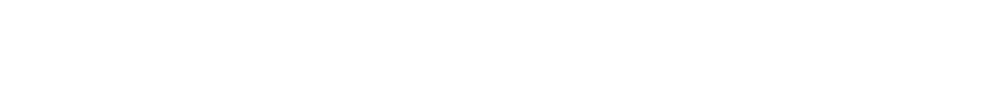

In [92]:
dt = DecisionTreeClassifier(max_depth=6).fit(X_train, y_train)
y_pred = dt.predict(X_test)
plot_tree(dt, X_train)

# 7. Models Comparison <a class="anchor" id="2"></a>

Accuracies 
 ROC Curve

# 8. Final Model - Kaggle Submission <a class="anchor" id="2"></a>